In [8]:
using Paths, Plots
using LinearAlgebra

STEINER_POINTS = 2

function draw(nodeDict)
    nodes = [item.second for item in nodeDict]
    edges = []
    s = scatter(map(x -> x.position, nodes), legend=nothing)
    for node in nodes
    # node = nodeDict[(3.5, 3.5)]
        for neighbor in node.neighbors
            plot!([node.position[1], neighbor.node.position[1]], [node.position[2], neighbor.node.position[2]], arrow=true)
        end
    end
    display(s)
end

function scatterNodes(nodeDict)
    nodes = [item.second for item in nodeDict]
    positions = map(x -> x.position, nodes)
    s = scatter(positions, legend=nothing)
    return s
end


function drawPath(source, path, s)
    pos = map(x -> x.position, path)
    pos = vcat([source], pos)
    for i in 1:length(pos)-1
        plot!([pos[i][1], pos[i+1][1]], [pos[i][2], pos[i+1][2]])
    end
    display(s)
end

drawPath (generic function with 1 method)

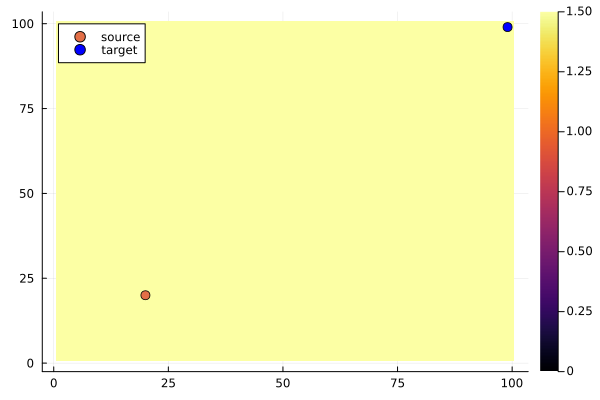

In [31]:
costs = zeros(Float64, (100, 100)) .+ 1.5
source = (20.0, 20.0)
target = (99.0, 99.0)
h = heatmap(transpose(costs))
scatter!(source, label="source", ms=5)
scatter!(target, label="target", color="blue", ms=5)
display(h)

In [32]:
nodesByPosition = Dict{Paths.Position, Node}(source => Node(source), target => Node(target))
visitedFaces = Set{Paths.Face}()
sourceNode = nodesByPosition[source]

Node((20.0, 20.0), Paths._Edge[])

In [33]:
function n(node)
    Paths.populateNeighbors!(node, nodesByPosition, visitedFaces, costs, STEINER_POINTS)
    return [(e.node, e.cost) for e in node.neighbors]
end
h = n->norm(n.position .- nodesByPosition[target].position)

#43 (generic function with 1 method)

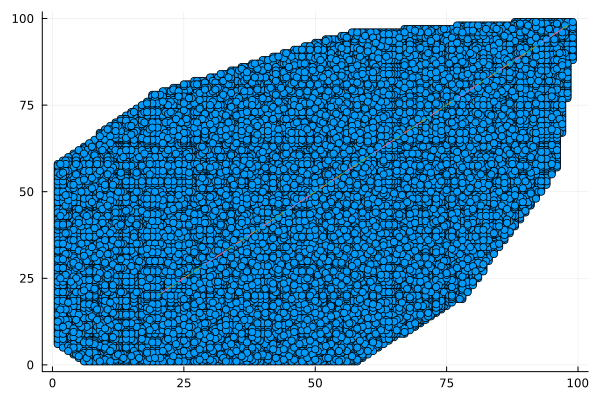

In [34]:
path, cost = Paths.astar(nodesByPosition[source], nodesByPosition[target], n, h)
s = scatterNodes(nodesByPosition)
drawPath(source, path, s)

In [ ]:
draw(nodesByPosition)